# Naive Bayes & Decision Tree

In [ ]:
from google.colab import files
 
uploaded = files.upload()

Saving games.csv to games (1).csv


# Importación de datos

In [ ]:
import pandas as pd
 
data = pd.read_csv('games.csv')
data.head()

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,...,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,...,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,...,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,...,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,...,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,...,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4


In [ ]:
# Información de la db

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   gameId                        9879 non-null   int64  
 1   blueWins                      9879 non-null   int64  
 2   blueWardsPlaced               9879 non-null   int64  
 3   blueWardsDestroyed            9879 non-null   int64  
 4   blueFirstBlood                9879 non-null   int64  
 5   blueKills                     9879 non-null   int64  
 6   blueDeaths                    9879 non-null   int64  
 7   blueAssists                   9879 non-null   int64  
 8   blueEliteMonsters             9879 non-null   int64  
 9   blueDragons                   9879 non-null   int64  
 10  blueHeralds                   9879 non-null   int64  
 11  blueTowersDestroyed           9879 non-null   int64  
 12  blueTotalGold                 9879 non-null   int64  
 13  blu

In [ ]:
print(data['gameId'].count())

9879


## **Limpieza de datos**

In [ ]:
df = data[data['blueWardsPlaced'] <= 100 ]
df = df[df['blueTotalMinionsKilled'] > 90 ]

In [ ]:
print(df['gameId'].count())

9770


## **Definir features (inputs) y la variable target (crítica/label)**


In [ ]:
features = ['blueTowersDestroyed', 'blueTotalMinionsKilled', 'blueKills']
X = df[features]
Y = df['blueWins']

In [ ]:
print(X)

      blueTowersDestroyed  blueTotalMinionsKilled  blueKills
0                       0                     195          9
1                       0                     174          5
2                       0                     186          7
3                       0                     201          4
4                       0                     210          6
...                   ...                     ...        ...
9874                    0                     211          7
9875                    0                     233          6
9876                    0                     210          6
9877                    0                     224          2
9878                    0                     207          6

[9770 rows x 3 columns]


In [ ]:
print(Y)

0       0
1       0
2       0
3       0
4       0
       ..
9874    1
9875    1
9876    0
9877    0
9878    1
Name: blueWins, Length: 9770, dtype: int64


# Creación de Modelo

In [ ]:
from sklearn.naive_bayes import BernoulliNB, MultinomialNB, GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

## 80% -20%

In [ ]:
# Sets de 80% entrenamiento y 20% testeo 
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=4)  

In [ ]:
import plotly.express as px
fig = px.scatter_3d(df, x='blueTowersDestroyed', y='blueTotalMinionsKilled', z='blueKills',
                    size = 'blueKills', color = 'blueWins')
fig.show()

In [ ]:
import plotly.graph_objs as go
#####
fig = go.Scatter3d( x=df['blueTowersDestroyed'],
                    y=df['blueTotalMinionsKilled'] ,
                    z=df['blueKills'], 
                   mode='markers',
                      marker=dict(
                                  color= df['blueWins'],
                                  size = df['blueKills'],
                                  colorscale='Plotly3',
                                  opacity=0.9,)
                   )
data = [fig]

layout = go.Layout(margin=dict(l=0,
                               r=0,
                               b=0,
                               t=0))

fig = go.Figure(data=data, layout=layout)
fig.show()

#### NB Bernoulli 

In [ ]:
# Crear y ajustar el modelo
bnb = BernoulliNB(binarize = 0.0)
bnb.fit(x_train, y_train)

# Realizar predicciones con set de entrenamiento
y_pred = bnb.predict(x_test)

# Hacer pruebas y validaciones
score = bnb.score(x_test, y_test)
print('\nAcurracy: ', score, '= ', round(score * 100, 2),'% \n')

print(classification_report(y_test, y_pred))
print('Mean Absolute Error:', 
      round(metrics.mean_absolute_error(y_test, y_pred), 5))
print('Mean Squared Error:', 
      round(metrics.mean_squared_error(y_test, y_pred), 5))
print('Root Mean Squared Error:', 
      round(np.sqrt(metrics.mean_squared_error(y_test, y_pred)), 5))


Acurracy:  0.522517911975435 =  52.25 % 

              precision    recall  f1-score   support

           0       0.51      0.98      0.67       982
           1       0.75      0.06      0.11       972

    accuracy                           0.52      1954
   macro avg       0.63      0.52      0.39      1954
weighted avg       0.63      0.52      0.39      1954

Mean Absolute Error: 0.47748
Mean Squared Error: 0.47748
Root Mean Squared Error: 0.691


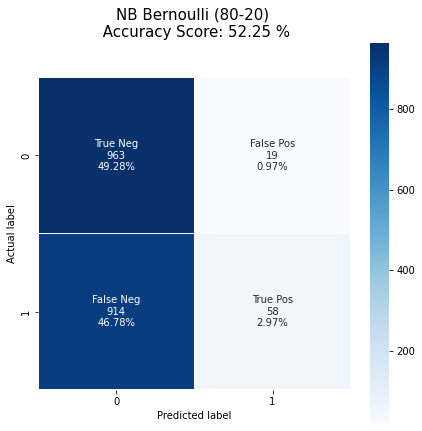

In [ ]:
# ---- Matriz de confusión ----
cm = metrics.confusion_matrix(y_test, y_pred)

# Crear grupos de strings para mostrar nombre de etiqueta, conteo y porcentaje
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]

# Formateo y agrupación de etiquetas
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

# Creación de gráfico 
plt.figure(figsize=(7,7))
sns.heatmap(cm, annot=labels, fmt='', linewidths=.5, 
            square = True, cmap = 'Blues')
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'NB Bernoulli (80-20) \n Accuracy Score: {0} %\n\n'.format(round(score * 100, 2))
plt.title(all_sample_title, size = 15);

#### NB Multinomial

In [ ]:
# Crear y ajustar el modelo
mnb = MultinomialNB()
mnb.fit(x_train, y_train)

# Realizar predicciones con set de entrenamiento
y_pred = mnb.predict(x_test)

# Hacer pruebas y validaciones
score = mnb.score(x_test, y_test)
print('\nAcurracy: ', score, '= ', round(score * 100, 2),'% \n')

print(classification_report(y_test, y_pred))
print('Mean Absolute Error:', 
      round(metrics.mean_absolute_error(y_test, y_pred), 5))
print('Mean Squared Error:', 
      round(metrics.mean_squared_error(y_test, y_pred), 5))
print('Root Mean Squared Error:', 
      round(np.sqrt(metrics.mean_squared_error(y_test, y_pred)), 5))


Acurracy:  0.6207778915046059 =  62.08 % 

              precision    recall  f1-score   support

           0       0.61      0.66      0.64       982
           1       0.63      0.58      0.60       972

    accuracy                           0.62      1954
   macro avg       0.62      0.62      0.62      1954
weighted avg       0.62      0.62      0.62      1954

Mean Absolute Error: 0.37922
Mean Squared Error: 0.37922
Root Mean Squared Error: 0.61581


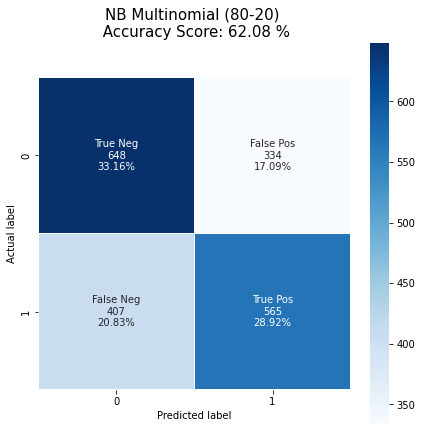

In [ ]:
# ---- Matriz de confusión ----
cm = metrics.confusion_matrix(y_test, y_pred)

# Crear grupos de strings para mostrar nombre de etiqueta, conteo y porcentaje
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]

# Formateo y agrupación de etiquetas
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

# Creación de gráfico 
plt.figure(figsize=(7,7))
sns.heatmap(cm, annot=labels, fmt='', linewidths=.5, 
            square = True, cmap = 'Blues')
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'NB Multinomial (80-20) \n Accuracy Score: {0} %\n\n'.format(round(score * 100, 2))
plt.title(all_sample_title, size = 15);

### NB Gaussian

In [ ]:
# Crear y ajustar el modelo
gnb = GaussianNB()
gnb.fit(x_train, y_train)

# Realizar predicciones con set de entrenamiento
y_pred = gnb.predict(x_test)

# Hacer pruebas y validaciones
score = gnb.score(x_test, y_test)
print('\nAcurracy: ', score, '= ', round(score * 100, 2),'% \n')

print(classification_report(y_test, y_pred))
print('Mean Absolute Error:', 
      round(metrics.mean_absolute_error(y_test, y_pred), 5))
print('Mean Squared Error:', 
      round(metrics.mean_squared_error(y_test, y_pred), 5))
print('Root Mean Squared Error:', 
      round(np.sqrt(metrics.mean_squared_error(y_test, y_pred)), 5))


Acurracy:  0.6212896622313203 =  62.13 % 

              precision    recall  f1-score   support

           0       0.58      0.91      0.71       982
           1       0.78      0.33      0.46       972

    accuracy                           0.62      1954
   macro avg       0.68      0.62      0.59      1954
weighted avg       0.68      0.62      0.59      1954

Mean Absolute Error: 0.37871
Mean Squared Error: 0.37871
Root Mean Squared Error: 0.61539


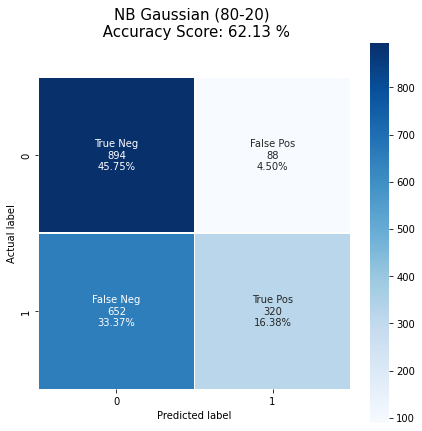

In [ ]:
# ---- Matriz de confusión ----
cm = metrics.confusion_matrix(y_test, y_pred)

# Crear grupos de strings para mostrar nombre de etiqueta, conteo y porcentaje
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]

# Formateo y agrupación de etiquetas
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

# Creación de gráfico 
plt.figure(figsize=(7,7))
sns.heatmap(cm, annot=labels, fmt='', linewidths=.5, 
            square = True, cmap = 'Blues')
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'NB Gaussian (80-20) \n Accuracy Score: {0} %\n\n'.format(round(score * 100, 2))
plt.title(all_sample_title, size = 15);

### Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [ ]:
# Crear y ajustar el modelo
dtc = DecisionTreeClassifier()
dtc.fit(x_train, y_train)

# Realizar predicciones con set de entrenamiento
y_pred = dtc.predict(x_test)

# Hacer pruebas y validaciones
score = dtc.score(x_test, y_test)
print('\nAcurracy: ', score, '= ', round(score * 100, 2),'% \n')

print(classification_report(y_test, y_pred))
print('Mean Absolute Error:', 
      round(metrics.mean_absolute_error(y_test, y_pred), 5))
print('Mean Squared Error:', 
      round(metrics.mean_squared_error(y_test, y_pred), 5))
print('Root Mean Squared Error:', 
      round(np.sqrt(metrics.mean_squared_error(y_test, y_pred)), 5))


Acurracy:  0.6269191402251791 =  62.69 % 

              precision    recall  f1-score   support

           0       0.62      0.66      0.64       982
           1       0.63      0.59      0.61       972

    accuracy                           0.63      1954
   macro avg       0.63      0.63      0.63      1954
weighted avg       0.63      0.63      0.63      1954

Mean Absolute Error: 0.37308
Mean Squared Error: 0.37308
Root Mean Squared Error: 0.6108


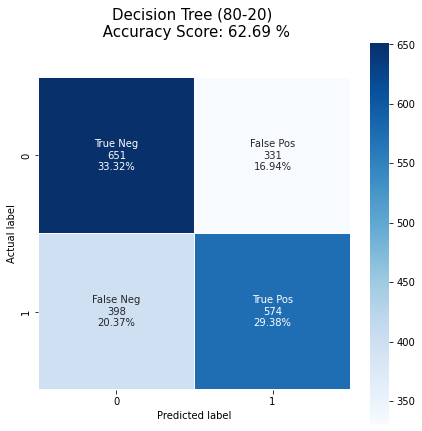

In [ ]:
# ---- Matriz de confusión ----
cm = metrics.confusion_matrix(y_test, y_pred)

# Crear grupos de strings para mostrar nombre de etiqueta, conteo y porcentaje
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]

# Formateo y agrupación de etiquetas
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

# Creación de gráfico 
plt.figure(figsize=(7,7))
sns.heatmap(cm, annot=labels, fmt='', linewidths=.5, 
            square = True, cmap = 'Blues')
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Decision Tree (80-20) \n Accuracy Score: {0} %\n\n'.format(round(score * 100, 2))
plt.title(all_sample_title, size = 15);

In [ ]:
# Visualizacion del modelo
plt.figure(figsize=(900,100), dpi=50)

#create the tree plot
a = tree.plot_tree(dtc,
                   #use the feature names stored
                   feature_names = features,
                   #use the class names stored
                   class_names = ['0 loss','1 win'],
                   rounded = True,
                   filled = True,
                   fontsize=14)


plt.savefig("Dtc.png", bbox_inches='tight', transparent='true')
